<a href="https://colab.research.google.com/github/17520299/DS102.L11.CNCL/blob/main/Project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!pip install -U torch==1.5 torchvision==0.6 -f https://download.pytorch.org/whl/cu101/torch_stable.html
!pip install cython pyyaml==5.1
!pip install -U 'git+https://github.com/cocodataset/cocoapi.git#subdirectory=PythonAPI'
import torch, torchvision
print(torch.__version__, torch.cuda.is_available())
!pip install detectron2==0.1.3 -f https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.5/index.html

Looking in links: https://download.pytorch.org/whl/cu101/torch_stable.html
     |████████████████████████████████| 703.8MB 26kB/s 
     |████████████████████████████████| 6.6MB 4.4MB/s 
  Found existing installation: torch 1.7.0+cu101
    Uninstalling torch-1.7.0+cu101:
      Successfully uninstalled torch-1.7.0+cu101
  Found existing installation: torchvision 0.8.1+cu101
    Uninstalling torchvision-0.8.1+cu101:
      Successfully uninstalled torchvision-0.8.1+cu101
     |████████████████████████████████| 276kB 8.4MB/s 
  Created wheel for pyyaml: filename=PyYAML-5.1-cp36-cp36m-linux_x86_64.whl size=44076 sha256=2fd12e2068eaad99f295dcebffc8f0fa966682527843dabb94efd20f15ff5a58
  Stored in directory: /root/.cache/pip/wheels/ad/56/bc/1522f864feb2a358ea6f1a92b4798d69ac783a28e80567a18b
Successfully built pyyaml
  Found existing installation: PyYAML 3.13
    Uninstalling PyYAML-3.13:
      Successfully uninstalled PyYAML-3.13
  Cloning https://github.com/cocodataset/cocoapi.git to /tmp/pip-

In [2]:
import detectron2 
from detectron2.utils.logger import setup_logger
setup_logger()
import cv2
import numpy as np
import random
from google.colab.patches import cv2_imshow

from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog

** fvcore version of PathManager will be deprecated soon. **
** Please migrate to the version in iopath repo. **
https://github.com/facebookresearch/iopath 



In [3]:
!wget https://www.dropbox.com/s/vzr55y4lqx7te2b/Dataset.zip
!unzip Dataset.zip

--2020-12-11 04:46:13--  https://www.dropbox.com/s/vzr55y4lqx7te2b/Dataset.zip
Resolving www.dropbox.com (www.dropbox.com)... 162.125.1.18, 2620:100:6016:18::a27d:112
Connecting to www.dropbox.com (www.dropbox.com)|162.125.1.18|:443... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: /s/raw/vzr55y4lqx7te2b/Dataset.zip [following]
--2020-12-11 04:46:13--  https://www.dropbox.com/s/raw/vzr55y4lqx7te2b/Dataset.zip
Reusing existing connection to www.dropbox.com:443.
HTTP request sent, awaiting response... 302 Found
Location: https://uc06192806d6257ed2412d196b5f.dl.dropboxusercontent.com/cd/0/inline/BE3T_z9DTd8b2PQtXLUP8wVDhHkCANh_BNkkoGMUqivdRvrz6356-0gGuIZMp4zp2lw4vVgGiJgWsieWJ6yJCQDsnmGgem1El1wOnAueTxgGptRp_KIM0sQTGfcqCYxm20s/file# [following]
--2020-12-11 04:46:13--  https://uc06192806d6257ed2412d196b5f.dl.dropboxusercontent.com/cd/0/inline/BE3T_z9DTd8b2PQtXLUP8wVDhHkCANh_BNkkoGMUqivdRvrz6356-0gGuIZMp4zp2lw4vVgGiJgWsieWJ6yJCQDsnmGgem1El1wOnAueTxgGptRp_K

In [4]:
import json
from detectron2.structures import BoxMode
def get_traffic_dicts(imgdir):
  json_file = imgdir+'/data.json'
  with open(json_file) as f:
    dataset_dicts = json.load(f)
  for i in dataset_dicts:
    filename=i['file_name']
    i['file_name'] = imgdir+"/"+filename
    for j in i['annotations']:
      j['bbox_mode'] = BoxMode.XYWH_ABS
      j['category_id'] = int(j['category_id'])
  return dataset_dicts
from detectron2.data import DatasetCatalog, MetadataCatalog
for d in ['Train','Test']:
  DatasetCatalog.register('traffic_'+d,lambda d=d: get_traffic_dicts('/content/Dataset/'+d))
  MetadataCatalog.get('traffic_ '+d).set(thing_classes=['pedestrian','car','van','bus','truck','motor','bicycle','tricycle','other'])
traffic_metadata = MetadataCatalog.get('traffic_train')

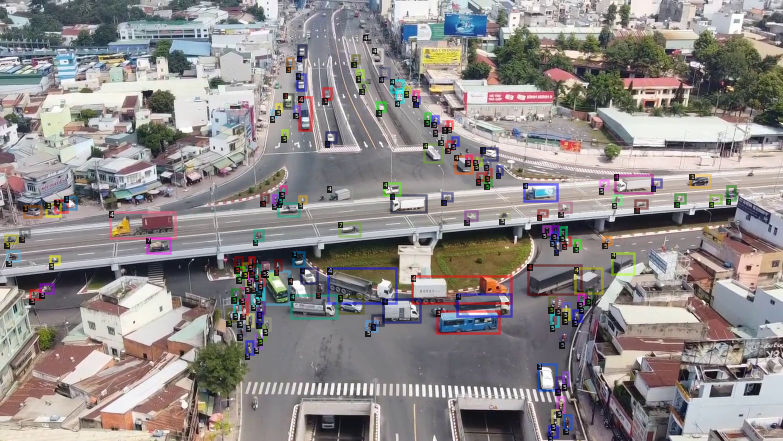

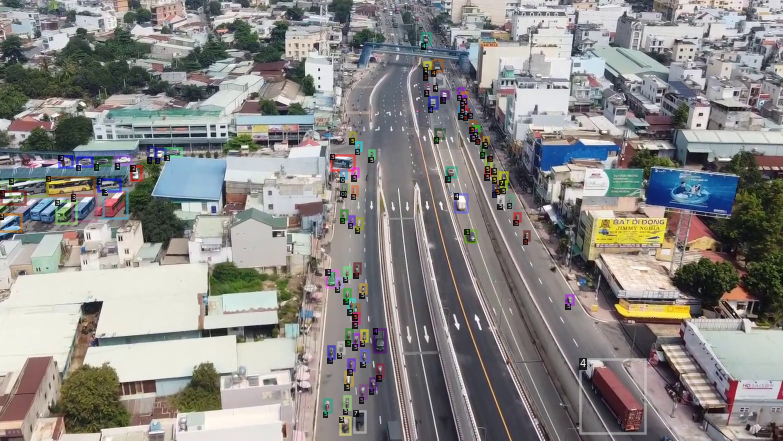

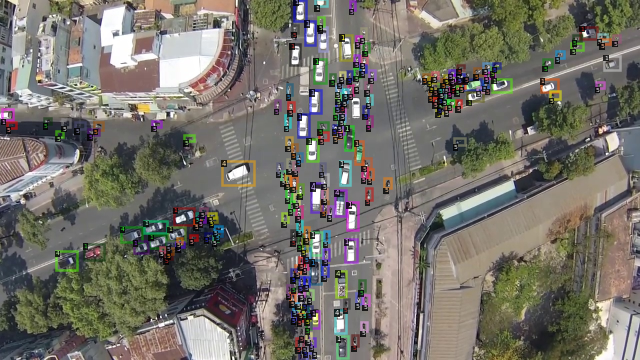

In [10]:
dataset_dicts = get_traffic_dicts('/content/Dataset/Train/')
for d in random.sample(dataset_dicts,3):
  img = cv2.imread(d['file_name'])
  visualizer = Visualizer(img[ :, :, ::-1], metadata=traffic_metadata,scale=0.5)
  vis = visualizer.draw_dataset_dict(d)
  cv2_imshow(vis.get_image()[:,:,::-1])

In [12]:
from detectron2.engine import DefaultTrainer
from detectron2.config import get_cfg
import os

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("traffic_Train",)
cfg.DATASETS.TEST = ()
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url('COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml')
cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.BASE_LR = 0.00025
cfg.SOLVER.MAX_ITER = 1500
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 9

os.makedirs(cfg.OUTPUT_DIR,exist_ok=True)
trainer = DefaultTrainer(cfg)
trainer.resume_or_load(resume=False)
trainer.train()

[12/11 05:01:41 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

Exception ignored in: <bound method _MultiProcessingDataLoaderIter.__del__ of <torch.utils.data.dataloader._MultiProcessingDataLoaderIter object at 0x7fac9e8e2b38>>
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/torch/utils/data/dataloader.py", line 962, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.6/dist-packages/torch/utils/data/dataloader.py", line 942, in _shutdown_workers
    w.join()
  File "/usr/lib/python3.6/multiprocessing/process.py", line 124, in join
    res = self._popen.wait(timeout)
  File "/usr/lib/python3.6/multiprocessing/popen_fork.py", line 50, in wait
    return self.poll(os.WNOHANG if timeout == 0.0 else 0)
  File "/usr/lib/python3.6/multiprocessing/popen_fork.py", line 28, in poll
    pid, sts = os.waitpid(self.pid, flag)
KeyboardInterrupt: 


[12/11 06:06:38 d2.data.build]: Removed 0 images with no usable annotations. 1253 images left.
[12/11 06:06:38 d2.data.common]: Serializing 1253 elements to byte tensors and concatenating them all ...
[12/11 06:06:38 d2.data.common]: Serialized dataset takes 3.92 MiB
[12/11 06:06:38 d2.data.detection_utils]: TransformGens used in training: [ResizeShortestEdge(short_edge_length=(640, 672, 704, 736, 768, 800), max_size=1333, sample_style='choice'), RandomFlip()]
[12/11 06:06:38 d2.data.build]: Using training sampler TrainingSampler


Skip loading parameter 'roi_heads.box_predictor.cls_score.weight' to the model due to incompatible shapes: (81, 1024) in the checkpoint but (10, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.cls_score.bias' to the model due to incompatible shapes: (81,) in the checkpoint but (10,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.weight' to the model due to incompatible shapes: (320, 1024) in the checkpoint but (36, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.bias' to the model due to incompatible shapes: (320,) in the checkpoint but (36,) in the model! You might want to double check if this is expected.


[12/11 06:06:39 d2.engine.train_loop]: Starting training from iteration 0
[12/11 06:06:51 d2.utils.events]:  eta: 0:14:51  iter: 19  total_loss: 4.172  loss_cls: 2.404  loss_box_reg: 0.380  loss_rpn_cls: 0.945  loss_rpn_loc: 0.373  time: 0.5928  data_time: 0.0234  lr: 0.000005  max_mem: 13910M
[12/11 06:07:02 d2.utils.events]:  eta: 0:14:28  iter: 39  total_loss: 3.523  loss_cls: 2.284  loss_box_reg: 0.427  loss_rpn_cls: 0.413  loss_rpn_loc: 0.364  time: 0.5892  data_time: 0.0048  lr: 0.000010  max_mem: 13910M
[12/11 06:07:15 d2.utils.events]:  eta: 0:14:25  iter: 59  total_loss: 3.128  loss_cls: 2.066  loss_box_reg: 0.381  loss_rpn_cls: 0.276  loss_rpn_loc: 0.349  time: 0.5990  data_time: 0.0043  lr: 0.000015  max_mem: 13910M
[12/11 06:07:27 d2.utils.events]:  eta: 0:14:22  iter: 79  total_loss: 2.835  loss_cls: 1.745  loss_box_reg: 0.493  loss_rpn_cls: 0.213  loss_rpn_loc: 0.308  time: 0.6060  data_time: 0.0054  lr: 0.000020  max_mem: 13910M
[12/11 06:07:40 d2.utils.events]:  eta: 0:

In [13]:
%load_ext tensorboard
%tensorboard --logdir output

<IPython.core.display.Javascript object>

In [15]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR,"model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST= 0.7
cfg.DATASETS.TEST = ('traffic_Test',)
predictor = DefaultPredictor(cfg)

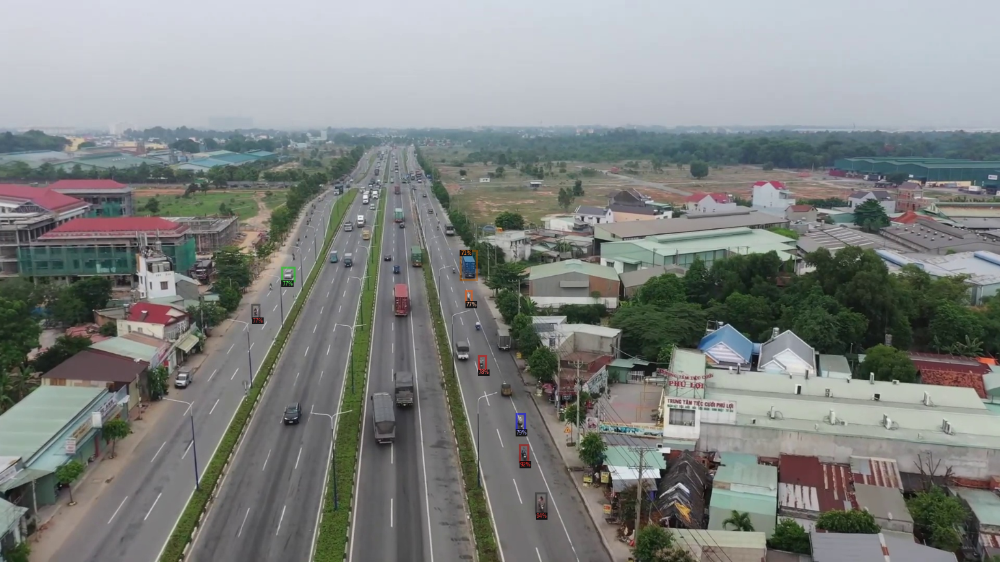

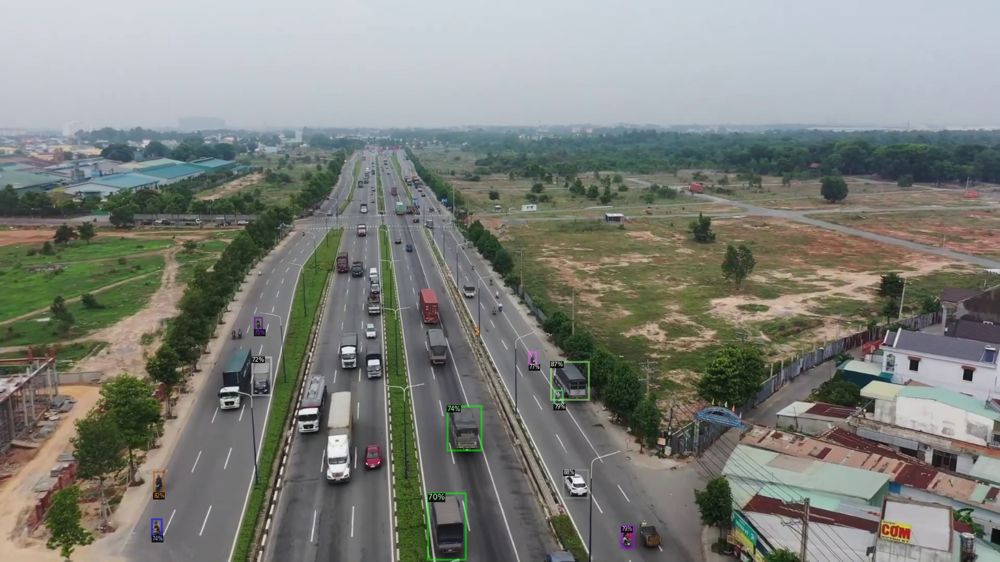

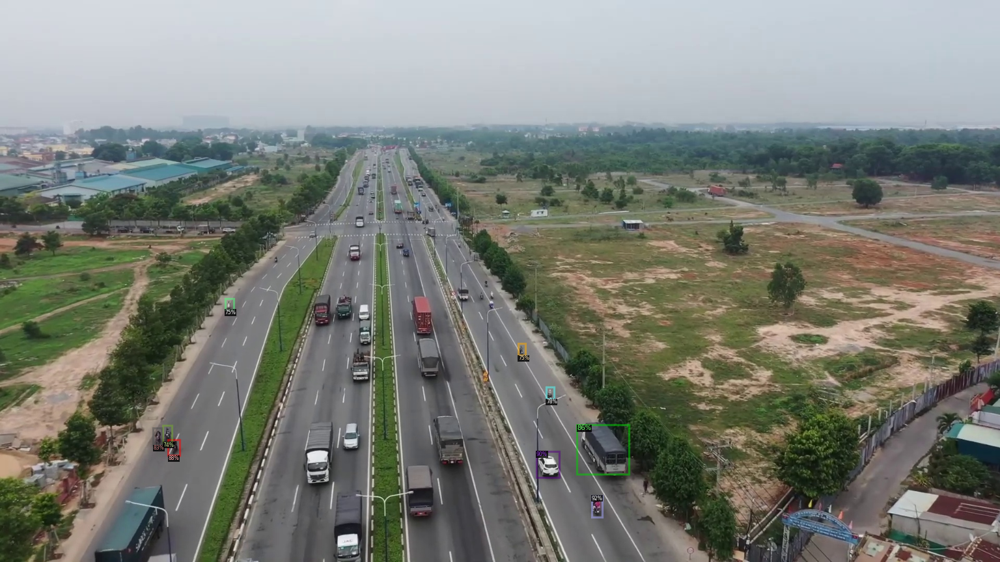

In [32]:
from detectron2.utils.visualizer import ColorMode
dataset_dicts = get_traffic_dicts('/content/Dataset/Test')
for d in random.sample(dataset_dicts,3):
  im = cv2.imread(d['file_name'])
  outputs = predictor(im)
  v = Visualizer(im[:, :, ::-1], metadata=traffic_metadata, scale=0.8, instance_mode=ColorMode.IMAGE)
  v = v.draw_instance_predictions(outputs['instances'].to('cpu'))
  cv2_imshow(v.get_image()[:, :, ::-1])

In [30]:
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader

evaluator = COCOEvaluator("traffic_Test", cfg, False, output_dir = "/content/out/")
test_loader = build_detection_test_loader(cfg, "traffic_Test")

inference_on_dataset(predictor.model, test_loader, evaluator)

FileNotFoundError: ignored